In [14]:
import moviepy.editor as mp
import imageio
import numpy as np
import h5py

def extract_frames(video_path, start_time, end_time, num_frames=40):
    video = mp.VideoFileClip(video_path)
    fps = video.fps
    start_frame = int(start_time * fps)
    end_frame = int(end_time * fps)
    print(fps)

    frames = []
    for i, frame in enumerate(video.iter_frames(fps=fps, dtype='uint8'), start=1):
        if start_frame <= i <= end_frame:
            frames.append(frame)
        elif i > end_frame:
            break

    # Sample uniformly from the frames
    sampled_frames = np.array(frames)[np.linspace(0, len(frames) - 1, num_frames, dtype=int)]

    return sampled_frames

def save_frames_to_h5(frames, output_path):
    with h5py.File(output_path, 'w') as hf:
        hf.create_dataset('frames', data=frames)

In [15]:
video_path = './datasets/data_v2/draw_light_oven/videos/0/0/color.mp4'
start_time = 10  # start time in seconds
end_time = 20    # end time in seconds
num_frames = 40

extracted_frames = extract_frames(video_path, start_time, end_time, num_frames)

output_h5_path = "./h5/output_frames.h5"
save_frames_to_h5(extracted_frames, output_h5_path)

30.0


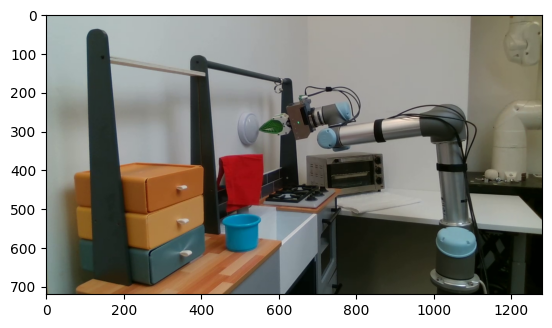

In [13]:
# play video from h5 data
# check data.hdf5

import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, HTML
import matplotlib.animation as animation

def play_gif(hf):
    ims = hf['frames'][:]

    # Assuming ims is a NumPy array with shape (frames, height, width, channels)
    frames = ims.shape[0]

    # Function to update the animation frames
    def update(frame):
        im.set_array(ims[frame])

    # Create a figure and axis
    fig, ax = plt.subplots()

    # Display the initial frame
    im = ax.imshow(ims[0])

    # Create the animation
    ani = animation.FuncAnimation(fig, update, frames=frames, repeat=False)

    # Display the animation
    display((HTML(ani.to_jshtml())))

def print_h5py_group(group, indent=0):
    """Recursively print the structure of an h5py group."""
    for key in group.keys():
        if isinstance(group[key], h5py.Group):
            print(" " * indent + f"Group: {key}")
            print_h5py_group(group[key], indent + 2)
        elif isinstance(group[key], h5py.Dataset):
            print(" " * indent + f"Dataset: {key}")

with h5py.File('./h5/output_frames.h5', 'r') as hf:
    play_gif(hf)

In [11]:
with h5py.File('./h5/output_frames.h5', 'r') as hf:
    print(hf['frames'][:].shape)

(40, 720, 1280, 3)
